<a href="https://colab.research.google.com/github/sjkim-audio/Bass-separator/blob/main/notebooks/archive/Exp007_Model_evaluation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:

# =================================================================
# [Bass Separator] Universal Environment Setup (v2.0)
# =================================================================
import os
import sys
from google.colab import drive

# -----------------------------------------------------------------
# 1. Google Drive Mount & Project Path Setup
# -----------------------------------------------------------------
drive.mount('/content/drive')

PROJECT_NAME = "Bass-separator"
REPO_URL = "https://github.com/sjkim-audio/Bass-separator.git"
PROJECT_PATH = f"/content/{PROJECT_NAME}"

# Clone or Pull Repository
if not os.path.exists(PROJECT_PATH):
    print(f"📦 Cloning repository... ({PROJECT_NAME})")
    !git clone {REPO_URL}
else:
    print(f"🔄 Updating repository... (Git Pull)")
    !cd {PROJECT_PATH} && git pull

# Set Working Directory (Crucial for finding requirements.txt)
if PROJECT_PATH not in sys.path:
    sys.path.append(PROJECT_PATH)
os.chdir(PROJECT_PATH)
print(f"📂 Working Directory set to: {os.getcwd()}")

# -----------------------------------------------------------------
# 2. Initialize Environment using [src] modules
# -----------------------------------------------------------------
try:
    # Import custom modules from the repository
    from src.env_setup import init_colab_env
    from src.utils import load_data_from_drive

    # A. Run Unified Setup
    #    - Installs system dependencies (FFmpeg)
    #    - Installs Python libraries from 'requirements.txt'
    init_colab_env()

    # B. Load Dataset from Drive
    #    Change this path to match your Google Drive structure
    MY_DRIVE_DATA_PATH = "/content/drive/MyDrive/Bass_separator/dataset"
    load_data_from_drive(MY_DRIVE_DATA_PATH)

except ImportError as e:
    print(f"⚠️ Error importing src modules: {e}")
    print("   Please check if the repository was cloned successfully.")
except Exception as e:
    print(f"❌ Setup failed: {e}")

# -----------------------------------------------------------------
# 3. Pre-load Common Libraries
# -----------------------------------------------------------------
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
import soundfile as sf
from IPython.display import Audio, display

print("\n🚀 Ready to Rock! (All libraries loaded)")

Mounted at /content/drive
📦 Cloning repository... (Bass-separator)
Cloning into 'Bass-separator'...
remote: Enumerating objects: 656, done.
remote: Counting objects: 100% (158/158), done.
remote: Compressing objects: 100% (96/96), done.
remote: Total 656 (delta 112), reused 60 (delta 60), pack-reused 498 (from 1)
Receiving objects: 100% (656/656), 294.63 MiB | 33.77 MiB/s, done.
Resolving deltas: 100% (363/363), done.
📂 Working Directory set to: /content/Bass-separator
🚀 환경 설정을 시작합니다...

🔧 [시스템] 필수 도구 확인 중...
✅ FFmpeg가 이미 설치되어 있습니다.

🐍 [파이썬] 라이브러리 확인 중...
📄 requirements.txt 파일을 발견했습니다. 의존성 패키지를 설치합니다...
📦 패키지 일괄 설치 진행 중...
✅ 패키지 일괄 설치 완료.

🏥 설치 무결성 점검 (Health Check)...
✅ 필수 라이브러리가 모두 정상적으로 준비되었습니다!

🎉 모든 환경 설정이 완료되었습니다!
🚀 데이터 복사 시작...
   📂 Source: /content/drive/MyDrive/Bass_separator/dataset
   📂 Dest  : ./dataset
🎉 데이터 준비 완료! (총 5개 파일 복사됨)

🚀 Ready to Rock! (All libraries loaded)


In [5]:
import subprocess

# 분석할 오디오 파일의 경로를 입력
target_file_path = "/content/drive/MyDrive/Bass_separator/dataset/performance_test_demo(guitar + bass).wav"

# Demucs로 베이스 트랙 분리
print("🚀 Demucs 분리 시작...")

# 파일명 추출 (확장자 제외)
filename = os.path.splitext(os.path.basename(target_file_path))[0]

# Demucs 실행 (htdemucs 모델 사용)
cmd = f'demucs -n htdemucs "{target_file_path}"'
process = subprocess.run(cmd, shell=True, capture_output=True, text=True, check=False)

# 분리된 베이스 파일 경로 자동 탐색
# Demucs 기본 출력 경로: separated/htdemucs/파일명/bass.wav
bass_stem_path = os.path.join('separated', 'htdemucs', filename, 'bass.wav')
print(f"✅ 분리 완료! 베이스 트랙 경로: {bass_stem_path}")

# 오디오 재생
print("🎧 분리된 베이스 트랙 듣기:")
display(Audio(bass_stem_path))

🚀 Demucs 분리 시작...
✅ 분리 완료! 베이스 트랙 경로: separated/htdemucs/performance_test_demo(guitar + bass)/bass.wav
🎧 분리된 베이스 트랙 듣기:


In [11]:
from src.evaluation import run_evaluation
from src.visualization import compare_separation_visuals, visualize_metrics

reference_bass_path = '/content/drive/MyDrive/Bass_separator/dataset/performance_test_demo(bass).wav'
separated_bass_path = bass_stem_path

📊 Processing: bass.wav
----------------------------------------
🔹 Summary Statistics
----------------------------------------
✅ Median SDR: 18.73 dB
✅ Median SIR: inf dB
✅ Median SAR: 15.60 dB
----------------------------------------


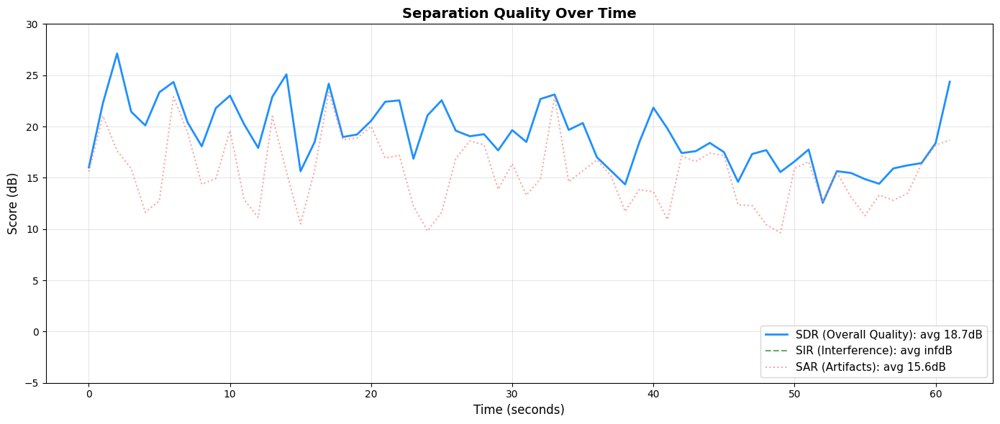

In [13]:
metrics = run_evaluation(reference_bass_path, separated_bass_path, show_plot=True)
visualize_metrics(metrics)

**Separation Quality Over Time**

**SDR (Signal-to-Distortion Ratio)**
- 전체적인 음원 분리 품질을 나타내는 지표. 일반적으로 10dB 이상이면 우수한 분리로 간주
- 18.7dB는 원본과 매우 유사하게 분리되었음을 의미

**SIR (Signal-to-Interference Ratio)**
- 다른 악기 소리(드럼, 보컬 등)가 베이스 트랙에 얼마나 섞이지 않았는지를 난타내는 지표.
- 높을수록 좋음. 실험결과 inf dB

**SAR (Signal-to-Artifacts Ratio)**
- 분리 과정에서 발생하는 인위적인 잡음(Artifact)을 나타내는 지표.
- 높을수록 좋으며 15.6dB로 15dB 이상을 유지하고 있어, 청감상 왜곡이 적고 자연스러운 음질을 보장

In [ ]:
compare_separation_visuals(reference_bass_path, separated_bass_path)

**파형(Waveform) & 스펙트로그램(Spectrogram) 일치도**

In [ ]:
# 1. 설정 및 경로
target_file_path = "/content/drive/MyDrive/Bass_separator/dataset/performance_test_demo(guitar + bass).wav"
reference_bass_path = '/content/drive/MyDrive/Bass_separator/dataset/performance_test_demo(bass).wav'
filename = os.path.splitext(os.path.basename(target_file_path))[0]

# 비교할 모델 리스트 및 실행 옵션 설정
models_to_test = [
    {"name": "htdemucs_two_stems", "cmd_opt": "htdemucs --two-stems=bass"},
    {"name": "htdemucs_6s", "cmd_opt": "htdemucs_6s"},
    {"name": "htdemucs_default", "cmd_opt": "htdemucs"}
]

all_metrics = {} # 모델별 지표 저장용

for model in models_to_test:
    model_name = model["name"]
    model_cmd = model["cmd_opt"]

    print(f"\n" + "="*50)
    print(f"📡 모델 실행 중: {model_name}")
    print(f"옵션: {model_cmd}")

    # 2. Demucs 실행
    # --two-stems=bass 옵션 사용 시와 일반 실행 시 저장 폴더명이 다를 수 있음에 유의
    # 기본적으로 -n 뒤의 첫 단어가 폴더명이 됩니다.
    folder_name = model_cmd.split()[0]
    cmd = f'demucs -n {model_cmd} "{target_file_path}"'

    subprocess.run(cmd, shell=True, capture_output=True, text=True, check=False)

    # 3. 분리된 베이스 파일 경로 설정
    # Demucs는 모델명 폴더 안에 결과를 저장합니다.
    separated_bass_path = os.path.join('separated', folder_name, filename, 'bass.wav')

    if os.path.exists(separated_bass_path):
        print(f"✅ {model_name} 분리 완료")

        # 4. 성능 평가 (run_evaluation 함수 활용)
        # 시각화는 마지막에 모아서 하기 위해 show_plot=False로 설정 가능
        print(f"📊 {model_name} 지표 계산 중...")
        metrics = run_evaluation(reference_bass_path, separated_bass_path, show_plot=False)

        # 결과 저장 (SDR 중앙값 등 요약 수치)
        all_metrics[model_name] = metrics

        # 오디오 출력 (확인용)
        print(f"🎧 {model_name} 결과물:")
        display(Audio(separated_bass_path))
    else:
        print(f"❌ {model_name} 결과 파일을 찾을 수 없습니다. 경로를 확인하세요: {separated_bass_path}")